In [54]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
from datetime import datetime
import os

In [86]:
df = pd.read_csv("../data/one_train_fine.csv",sep=',')
df.timestamp = pd.to_datetime(df.timestamp)
df.set_index('timestamp', inplace=True, drop=True)
df.head()

,value,label
timestamp,,
2017-05-01 00:00:00,1.901639,0
2017-05-01 00:01:00,1.786885,0
2017-05-01 00:02:00,2.000000,0
2017-05-01 00:03:00,1.885246,0
2017-05-01 00:04:00,1.819672,0


In [20]:
import plot_show

Loading BokehJS ...

In [61]:
plot_show.plt_all(new_df.value[:60*24*20])

In [119]:
def decompose(df):
    from statsmodels.tsa.seasonal import seasonal_decompose
    decomposition = seasonal_decompose(df.value[:60*24*20],freq=24*60,model="multiplicative")
    decomposition.plot()
    plt.gcf().set_size_inches(18,10)
    plt.show()

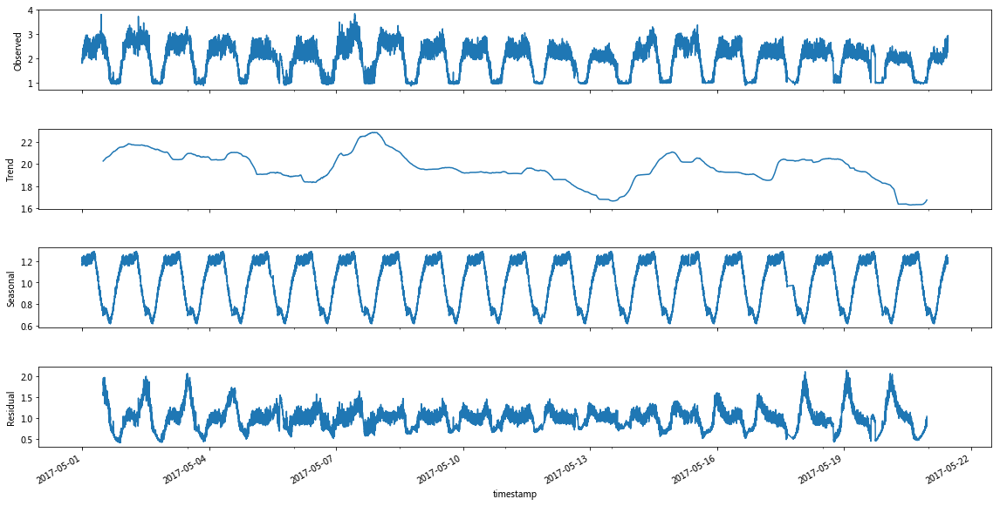

In [120]:
decompose(temp_df)

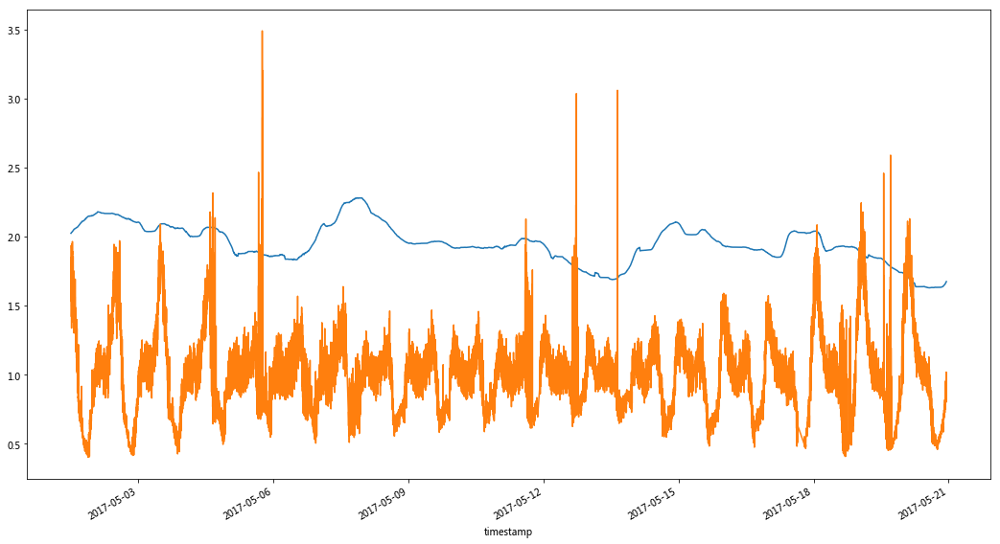

In [57]:
plt.figure(figsize=(18,10))
decomposition.trend.plot()
decomposition.resid.plot()
plt.show()

In [58]:
import pycast.methods.exponentialsmoothing

ModuleNotFoundError: No module named 'pycast'

In [73]:
# 去噪声，用前一天的值和前五分钟的值平均代替
def denoise(new_df):
    for i in range(60*24,new_df.shape[0]):
        if new_df.iloc[i].label == 1:
            new_df['value'] = (new_df.iloc[i-5:i].value.mean()+new_df.iloc[i-60*24].value)/2
    return new_df
clean_df = denoise(new_df)

/usr/share/anaconda3/lib/python3.6/site-packages/pandas/core/generic.py:3643: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value


In [92]:
print('anomal:',len(df[df.label==1].index),',all is:',df.shape[0])

anomal: 10550 ,all is: 128562


In [95]:
def denoise():
    temp_df = pd.read_csv("../data/one_train_fine.csv",sep=',')
    anomals = temp_df[temp_df.label==1]
    values = temp_df.value.values.tolist()
    for index in anomals.index:
        values[index] = (values[index-60*24]+np.mean(values[index-5:index]))/2
    temp_df.value = values
    temp_df['timestamp'] = pd.to_datetime(temp_df.timestamp)
    temp_df.set_index('timestamp',inplace=True,drop=True)
#     temp_df.to_csv("../data/denoised_one_train.csv")
    return temp_df

In [136]:
plot_show.plt_all(df.value[60*24*40:60*24*60])

In [128]:
plot_show.plt_all(temp_df.value)

In [127]:
plot_show.plt_all(temp_df.value[:60*24*31])

In [135]:
temp_df[60*24*22:60*24*30].to_csv("../data/one_train_denoised_7day.csv")